# Buildmodel

Build nonlinear time series models from scalar time series data using minimum description length radila basis function formalism

## Sample data

First we generate some typical test data to play with

In [1]:
include("ChaosFunctions.jl")

addnoise (generic function with 1 method)

In [2]:
using Plots

In [3]:
z=lorenzpoints(5000,0.05)

3×5001 Array{Float64,2}:
 -9.3954   -9.11588  -8.65294  -8.14648  …   0.348011  -0.90338  -1.72562
 -9.09342  -8.3313   -7.63451  -7.18491     -2.88828   -2.83896  -3.19333
 28.5537   28.7701   28.4925   27.8354      24.9674    21.8964   19.3518

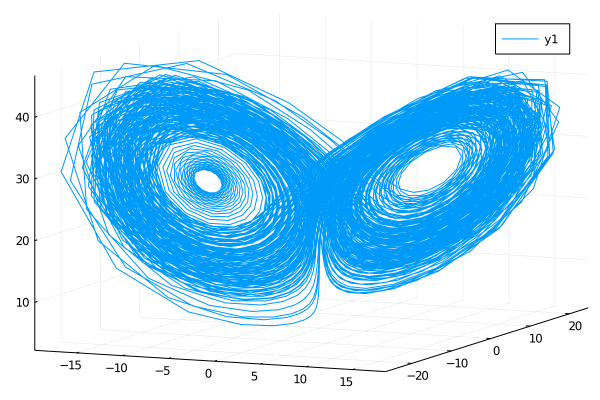

In [4]:
plot(z[1,:],z[2,:],z[3,:])

In [5]:
z=rosslerpoints(5000,0.2)

3×5001 Array{Float64,2}:
 -2.09051    -1.75877    -1.34197   …  -0.459284  -1.49662   -2.20517
 -1.45337    -1.90718    -2.303         3.23109    3.15526    2.90361
  0.0252208   0.0261013   0.027361      3.509      0.936751   0.227118

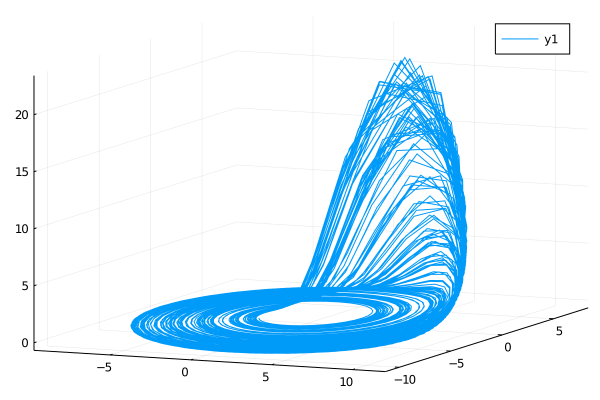

In [6]:
plot(z[1,:],z[2,:],z[3,:])

In [7]:
z=itmap(tinkerbell,-[0.7, 0.6],10000)

2×10000 Array{Float64,2}:
 -0.106024  -0.00524985   0.0848639  …  -0.0789416  -0.43416   -0.148745
 -0.407701  -0.329446    -0.171764      -0.978687   -0.492709  -0.686846

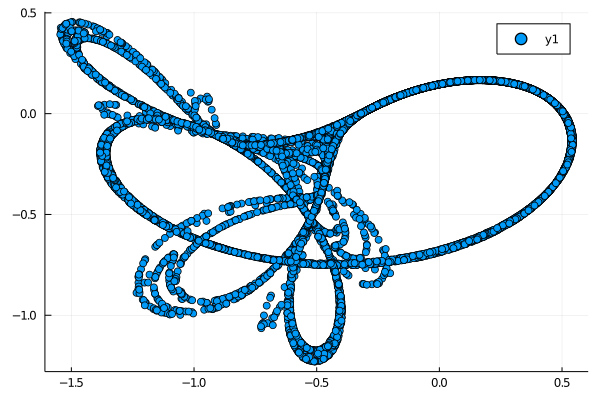

In [8]:
plot(z[2,:],z[1,:],linetype=:dots)

In [9]:
zn=addnoise(z,0.05)

2×10000 Array{Float64,2}:
 -0.113872   0.00918696   0.0968676  …  -0.0535013  -0.427346  -0.0897542
 -0.393932  -0.342203    -0.184251      -0.970435   -0.517963  -0.683114

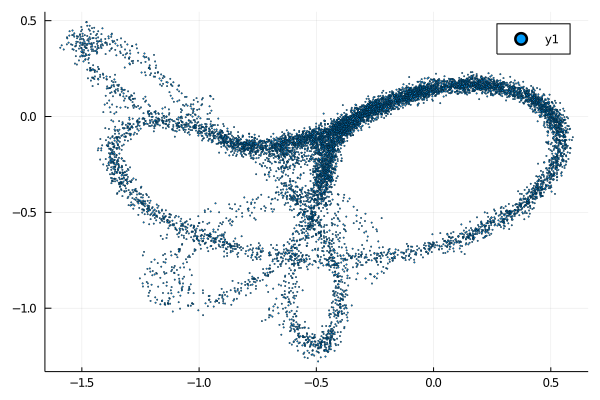

In [10]:
plot(zn[2,:],zn[1,:],linetype=:dots,markersize=1,markerstrokewidth=0.5)

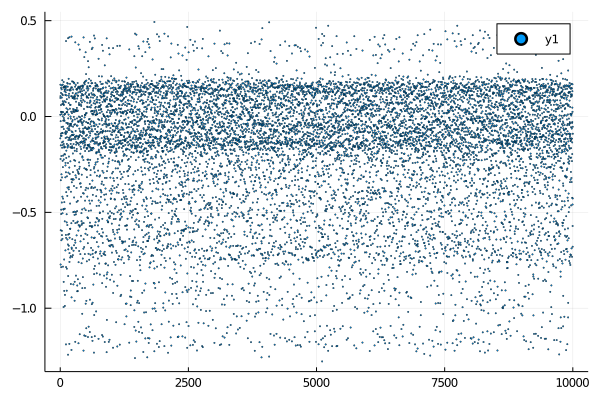

In [11]:
plot(zn[1,:],linetype=:dots,markersize=1,markerstrokewidth=0.5)

In [12]:
z=itmap(logistic,1/π,10^4);

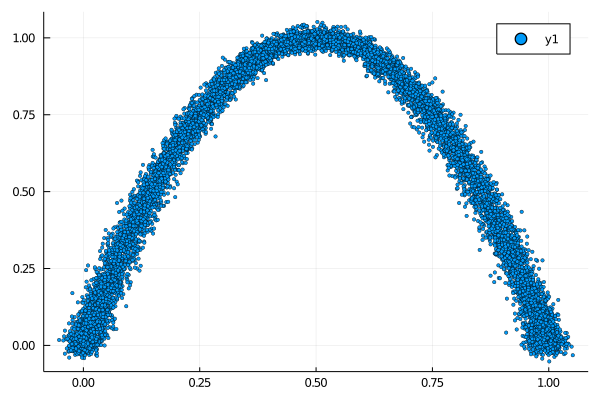

In [13]:
z=itmap(logistic,1/π,10^4);
zn=addnoise(z,0.05)
plot(zn[1:end-1],zn[2:end],linetype=:dots,markersize=2,markerstrokewidth = 0.5)

## Build the model

Import the modelling code, and away we go.

In [14]:
include("BasisFunctionTypes.jl")
include("Place.jl")

Main.Place

Any valid inline function can be used as a penlaty function (it must operate on globally defined functions in `Place.topdown` and must return a scalar, the algorithm seeks a minimum of this function. Four useful examples follow (description length ala `Rissanen` requires extra computation in the main code to account for parameter precisions.

In [15]:
#need to make these variables in scope of the current WS
nx=Int64(length(z))
mss=Float64(Inf)
λ=Array{Float64,1}[]
δ=Array{Float64,1}[]
#valid penalty criteria
Schwarz = :(nx*log(mss)+nk*log(nx))
Akaike = :(nx*log(mss)+2*nk)
Rissanen = :(description(mss,λ,δ,nx)) #Rissanen desciption length
Model30 = :(-nk*(nk<=30))
#nx is # of observation (length of data)
#nk is # of parameters (basis functions in model)
#mss is the mean-sum-square model prediction error
#λ are the model parameters and δ their precisions

:(-nk * (nk <= 30))

Next, the dictionary `options` defined model structure and optional modelling parameters (it'll run a produce something even if `options` is empty, but it might be better to populate this somewhat intelligently. A useful example to model the (admittedly rather simple) logistic map is provided

In [16]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String,Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

And, then, away we go...

In [17]:
mymodel, X, zout, mdlv = Place.buildmodel(zn,options)

dx=4, nx=7999
needδ=true
*MSS=0.12384859340432192 DL=3000.8422103236335 size=1
*MSS=0.11715918181337666 DL=2779.6843996351004 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=0.08733132449453573 DL=1609.5179308006789 size=2
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
MSS=0.10760535614348228 DL=2444.8579816026063 size=2
*MSS=0.047761128938078545 DL=-798.3596236849443 size=3
*MSS=0.03733848272090979 DL=-1781.2656663372804 size=3
*MSS=0.026666562974852086 DL=-3121.4157519876794 size=4
*MSS=0.013025964439216869 DL=-5983.740979566845 size=4
*MSS=0.010879395140542023 DL=-6696.9707477991615 size=5
*MSS=0.010751500299956949 DL=-6743.126311565056 size=5
*MSS=0.008068785749968296 DL=-7884.586578653948 size=6
MSS=0.010343142740217939 DL=-6889.666213651935 size=6
*MSS=0.007451097781985973 DL=-8195.890230646355 size=7
*MSS=0.007305427018287024 DL=-8268.372257566918 size=8
*MSS=0.007202341414130566 DL=-8319.089422279645 size=9
*MSS=0.006947917899106228 DL=-84

*MSS=0.0019015298141956787 DL=-13321.944683615657 size=53
MSS=0.0019009272067108923 DL=-13316.174131293912 size=54
MSS=0.0019004053773338545 DL=-13310.563681233067 size=55
MSS=0.0018980634657689518 DL=-13314.5814948468 size=55
MSS=0.0018973439187416456 DL=-13310.014531788349 size=56
MSS=0.0018912248863707714 DL=-13320.764006531905 size=56
MSS=0.0018905575278916145 DL=-13314.996203122877 size=57
*MSS=0.0018856055718844062 DL=-13323.751100316938 size=57
MSS=0.0018848997503294782 DL=-13318.597323466991 size=58
MSS=0.0018845316013330145 DL=-13318.95214805284 size=58
MSS=0.0018838963899308532 DL=-13314.14474831644 size=59
MSS=0.001884245317634237 DL=-13313.086435688745 size=59
MSS=0.0018836132753427839 DL=-13307.571303479861 size=60
MSS=0.0018821249284888973 DL=-13309.858423306117 size=60
MSS=0.0018815323171498732 DL=-13303.605994577294 size=61
MSS=0.0018813980408239647 DL=-13297.4570163664 size=62
MSS=0.0018792540264953041 DL=-13303.878725648981 size=62
MSS=0.0018791723355113478 DL=-13296.

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(tophat, [0, 2], 0.6856597546839678, [0.6685908018308017 0.47242294853696104 … 0.7209597422678787 0.49236749006442077; 0.07092478065470997 0.6627408521247778 … 0.08352995887905813 0.9379280577643714], [4.917503745600108]), Main.Place.BasisFunc(tophat, [0, 3], 0.6526849485326355, [0.6685908018308017 0.47242294853696104 … 0.7209597422678787 0.49236749006442077; 0.008415209891764534 0.7594194116389232 … 0.011626093457958502 0.6036225754430168], [4.3561926144613885]), Main.Place.BasisFunc(gaussian, [2], 0.08064251450409957, [0.07092478065470997 0.6627408521247778 … 0.08352995887905813 0.9379280577643714], Any[]), Main.Place.BasisFunc(tophat, [2], 0.6550841340659201, [0.07092478065470997 0.6627408521247778 … 0.08352995887905813 0.9379280577643714], [4.273939341667747]), Main.Place.BasisFunc(tophat, [0, 1, 2, 3], 0.4293861118325258, [0.6685908018308017 0.47242294853696104 … 0.7209597422678787 0.49236749006442077; 0.2309048810886

Modelling done, we can make one-step predictions on time series data

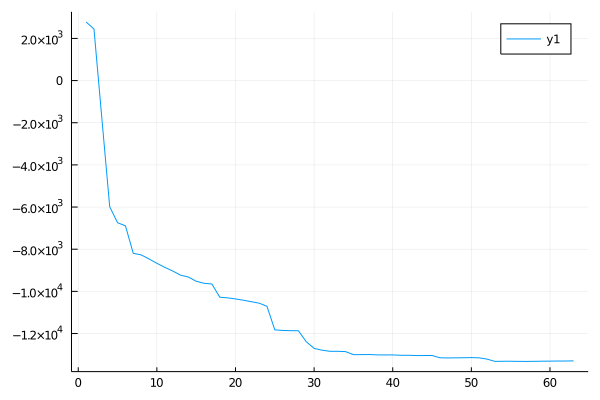

In [18]:
plot(mdlv)

In [19]:
yt,yp,ep = Place.predict(mymodel, z);

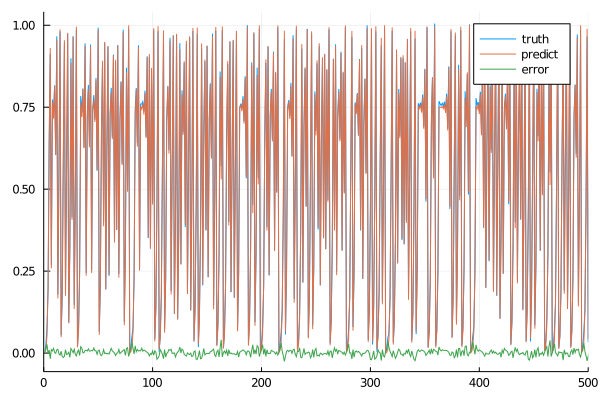

In [20]:
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

Or, free run simulations

In [21]:
yp, yt = Place.freerun(mymodel,zn,500)

([0.02345910728099145, 0.08655463126431347, 0.3047966716809733, 0.8676060808620032, 0.5134362704402179, 0.9816267062066305, 0.03567535504568087, 0.12240502023708015, 0.41600270645663256, 0.9552880064487771  …  0.40780450248426064, 0.9645609498941565, 0.13653994806774494, 0.465539456425682, 0.9871124144884319, 0.037427295431255246, 0.14194346482197673, 0.47059037226304135, 0.9836112884702299, 0.026927258951318204], [-0.0106373206501954, 0.00573424148682306, 0.07177783834649465, 0.2237631059003959, 0.6257063878111709, 0.8841338161860264, 0.2371704805151091, 0.7447596476680497, 0.703369126794392, 0.8105236926871713  …  0.14487518532445248, 0.5208960569417445, 0.9912792416266244, 0.002250424411371272, 0.0022466739834172992, 0.017466478732502313, 0.13220627693443304, 0.4436605326118556, 0.9779720115840447, 0.06092538460925846])

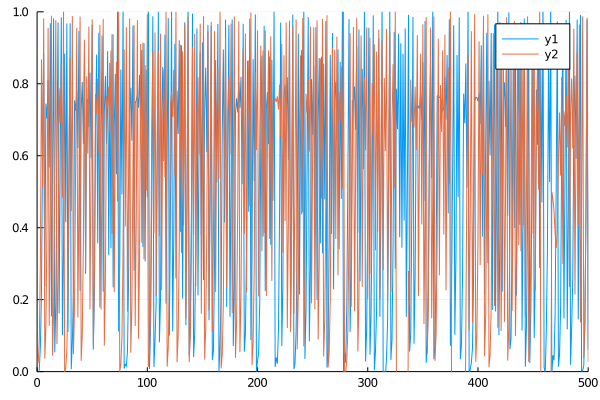

In [22]:
plot(yt)
plot!(yp,ylimit=(0,1),xlimit=(0,500))


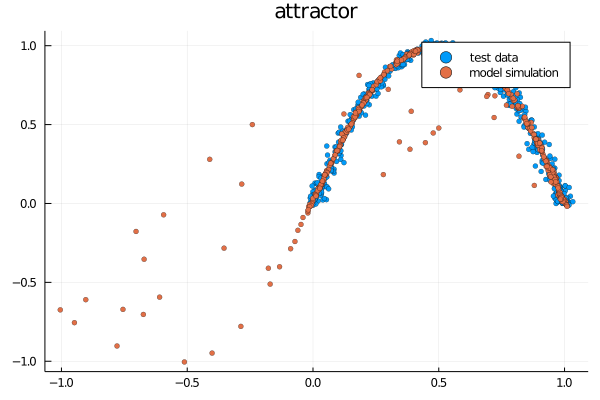

In [23]:
plot(yt[1:end-1],yt[2:end],linetype=:dots,markersize=3,markerstrokewidth = 0.3,label="test data")
plot!(yp[1:end-1],yp[2:end],linetype=:dots,markersize=3,markerstrokewidth = 0.3,label="model simulation",title="attractor")

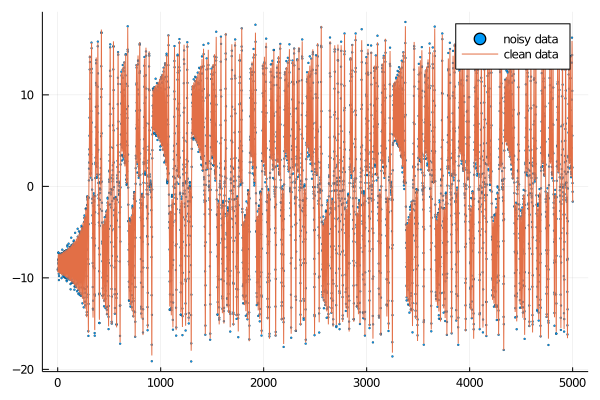

In [24]:
z=lorenzpoints(5000,0.05)
y=z[1,:]
yn=addnoise(y,0.05)
plot(yn,linetype=:dots,markersize=1.2,markerstrokewidth = 0.3,label="noisy data")
plot!(y,label="clean data")

In [25]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3,6,12]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String,Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

In [26]:
mymodel, X, zout, mdlv = Place.buildmodel(yn,options)

dx=13, nx=4488
needδ=true
*MSS=4.611207195347013 DL=9802.117939160436 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=3.047075651984932 DL=8877.422950593067 size=2
*MSS=2.7136536829073714 DL=8623.046671122405 size=3
*MSS=2.651656312983234 DL=8576.284041810784 size=4
*MSS=2.603722128360351 DL=8541.22061822056 size=5
*MSS=1.602545440089091 DL=7454.213305315858 size=5
*MSS=1.4342515434354062 DL=7203.0873901460145 size=5
*MSS=1.4293614199179996 DL=7201.721877439623 size=6
*MSS=1.2500044353501907 DL=6899.7305950868285 size=6
*MSS=1.2438317203177596 DL=6894.904141988849 size=7
*MSS=1.2326612326271797 DL=6874.835777453115 size=7
*MSS=0.9735916288190245 DL=6346.890896405434 size=7
MSS=0.9718342410108446 DL=6349.529628248408 size=8
*MSS=0.940265533094137 DL=6273.717136814567 size=8
*MSS=0.9373539395950635 DL=6273.128046297731 size=9
*MSS=0.9371755822842891 DL=6272.192759683856 size=9
MSS=0.9368314375201098 DL=6278.309132315602 size=10
*MSS=0.928173556605484 DL=6256.4797

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(tophat, [3], 9.208828739002763, [6.504562994215303 3.6240136511521412 … 0.5368864399604248 -2.7604604809922866], [3.6771949173419407]), Main.Place.BasisFunc(tophat, [2, 6], 6.587975288861916, [9.57809027418452 5.717035842242972 … 1.897207023038178 -4.617091137056488; 1.9926383052238241 2.3127842174631694 … -0.987154870491684 -0.8337229845833865], [3.3289915713911586]), Main.Place.BasisFunc(tophat, [0, 1, 3, 12], 27.526674109995678, [16.43349673716053 11.246217197429917 … 2.0511724015338944 -10.108166781257768; 12.701804496369862 8.091436112220782 … 1.0582890951585642 -6.841731172976108; 6.504562994215303 3.6240136511521412 … 0.5368864399604248 -2.7604604809922866; 5.374573684663221 12.487774004600817 … -14.736169801457184 3.7906704391750043], [4.3845030504626]), Main.Place.BasisFunc(tophat, [2, 3, 12], 11.968271846350937, [9.57809027418452 5.717035842242972 … 1.897207023038178 -4.617091137056488; 6.504562994215303 3.62401

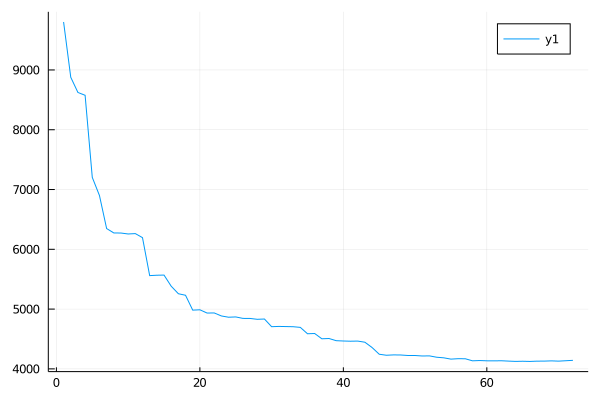

In [27]:
plot(mdlv)

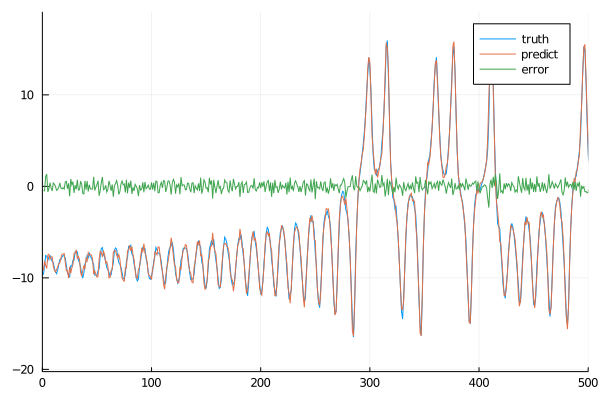

In [28]:
yt,yp,ep = Place.predict(mymodel, yn);
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

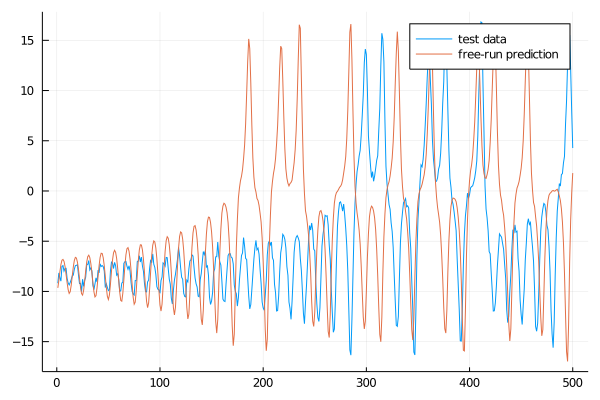

In [29]:
yp, yt = Place.freerun(mymodel,yn,500)
plot(yt,label="test data")
plot!(yp,label="free-run prediction")

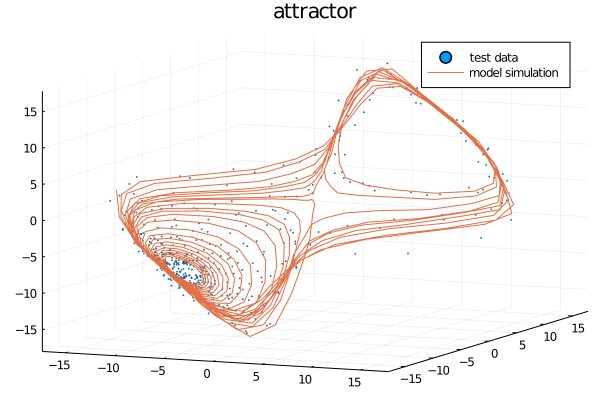

In [30]:
plot(yt[1:end-6],yt[4:end-3],yt[7:end],linetype=:dots,markersize=1,markerstrokewidth = 0.3,label="test data")
plot!(yp[1:end-6],yp[4:end-3],yp[7:end],label="model simulation",title="attractor")

## Michael Small

Last updated today ... 21/12